In [1]:
import cv2
import os
import numpy as np
from google.colab.patches import cv2_imshow

**Read, Display, Write and Draw Image**

In [2]:
img = cv2.imread('/content/sea.jpeg', 1)

In [3]:
print(type(img))
print(img.shape)

<class 'numpy.ndarray'>
(1500, 2250, 3)


In [4]:
half_img = cv2.resize(img, (0,0), fx=.5, fy=.5)

print(type(half_img))
print(half_img.shape)

<class 'numpy.ndarray'>
(750, 1125, 3)


change the first 50 rows and 5 colums to red

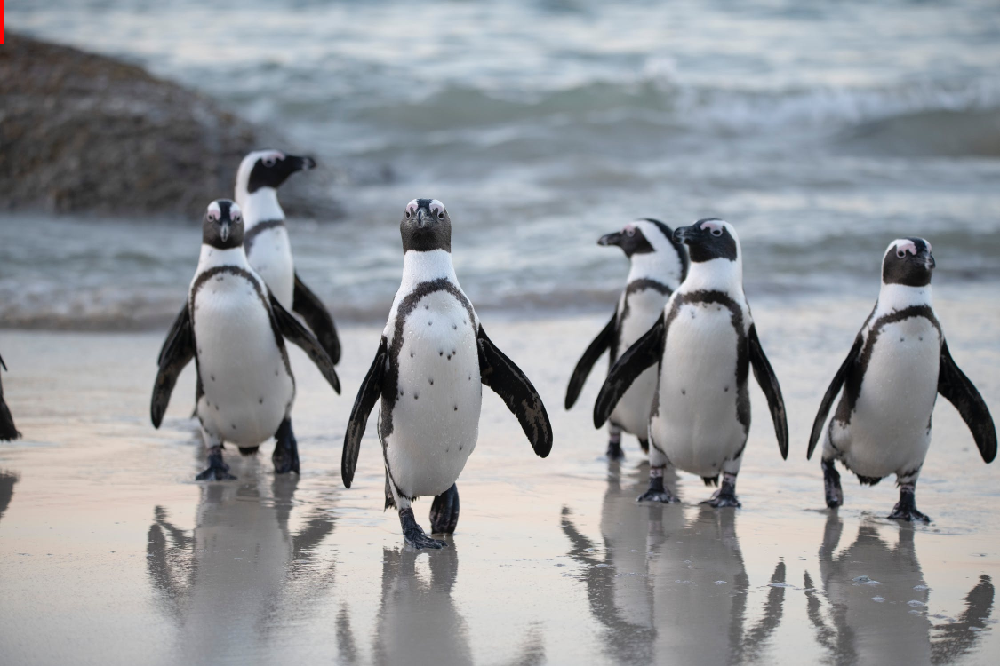

In [5]:
half_img[0:50, 0:5] = (0,0,255)

cv2_imshow(half_img)

Grayscale Image

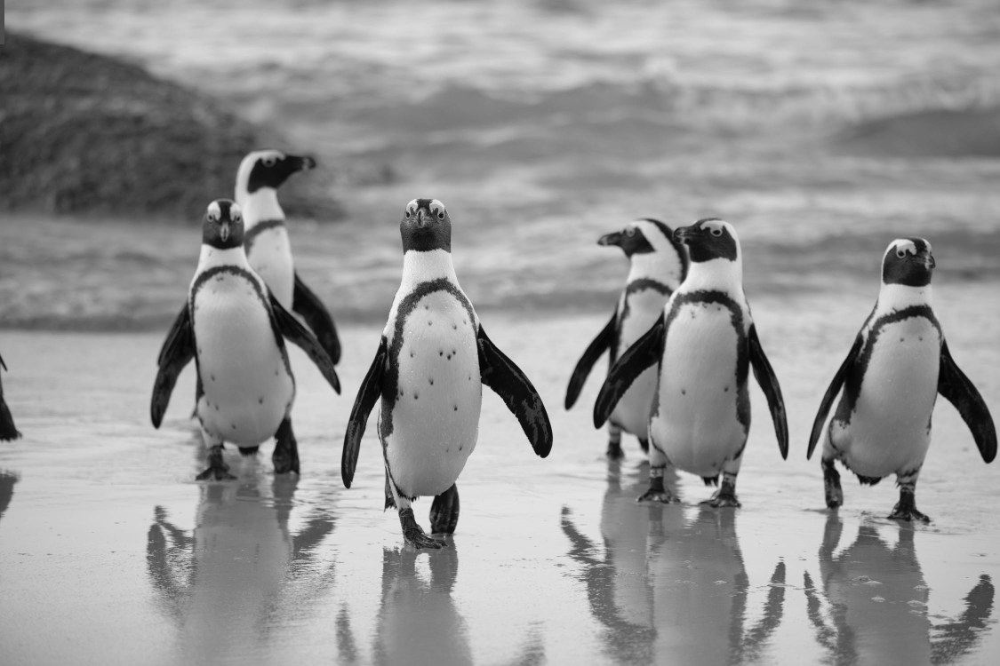

In [6]:
gray_img = cv2.cvtColor(half_img, cv2.COLOR_BGR2GRAY)

cv2_imshow(gray_img)

(750, 1125, 3)


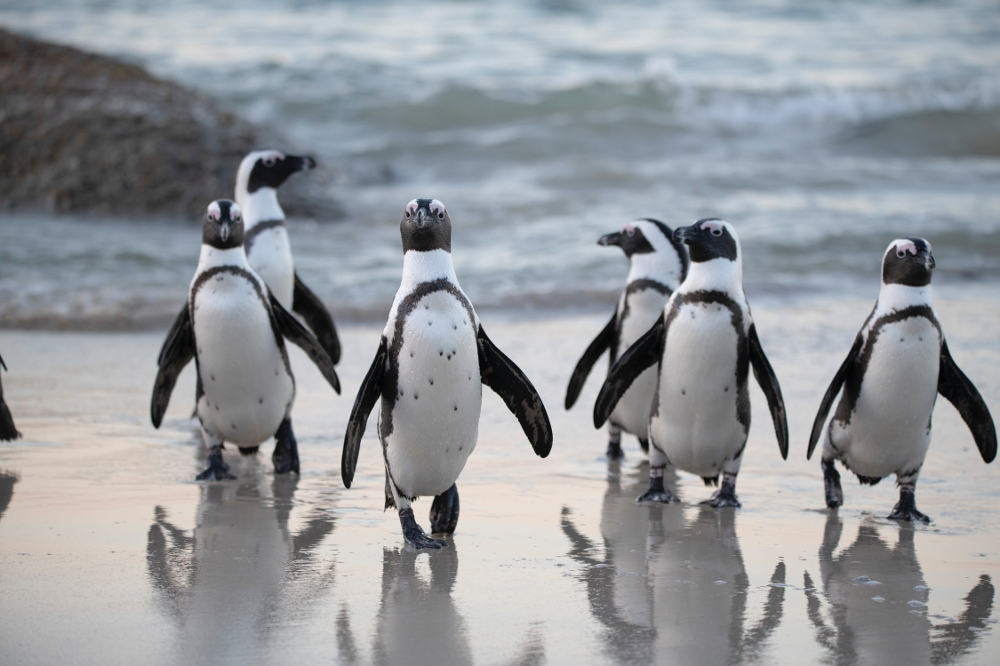

In [7]:
img = cv2.resize(img, (0,0), fx=.5, fy=.5)
print(img.shape)
cv2_imshow(img)

In [8]:
cv2.rectangle(img, (430, 216), (524, 285), (0,255,0), 5)
cv2.rectangle(img, (973, 259), (1070, 326), (255,0,255), 5)

array([[[151, 138, 124],
        [151, 138, 124],
        [151, 138, 124],
        ...,
        [161, 152, 142],
        [160, 151, 141],
        [157, 148, 138]],

       [[150, 137, 123],
        [150, 137, 123],
        [150, 137, 123],
        ...,
        [161, 152, 139],
        [160, 151, 138],
        [157, 148, 135]],

       [[149, 136, 122],
        [149, 136, 122],
        [149, 136, 122],
        ...,
        [159, 150, 137],
        [158, 149, 136],
        [157, 148, 135]],

       ...,

       [[150, 146, 145],
        [150, 146, 145],
        [150, 146, 145],
        ...,
        [167, 168, 166],
        [167, 168, 166],
        [166, 167, 165]],

       [[150, 146, 145],
        [152, 148, 147],
        [152, 148, 147],
        ...,
        [168, 169, 167],
        [166, 167, 165],
        [168, 169, 167]],

       [[149, 145, 144],
        [151, 147, 146],
        [151, 147, 146],
        ...,
        [168, 169, 167],
        [166, 167, 165],
        [164, 165, 163]]

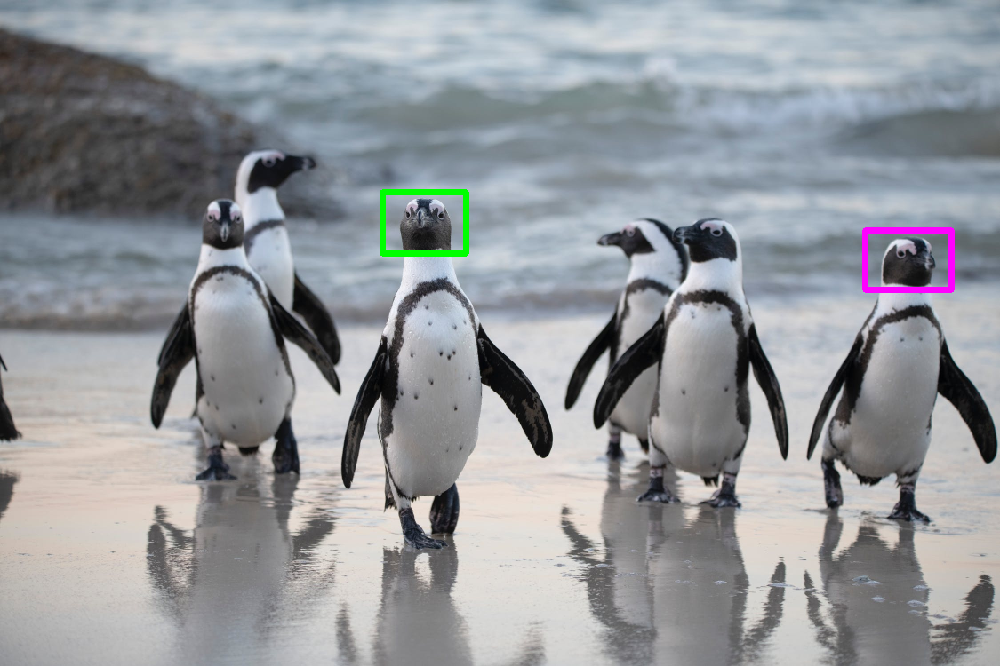

-1

In [9]:
cv2_imshow(img)
cv2.waitKey(0)

In [10]:
cv2.putText(img, "Penguin!", (432,320), cv2.FONT_HERSHEY_SIMPLEX,1, (0,0,0),1)

array([[[151, 138, 124],
        [151, 138, 124],
        [151, 138, 124],
        ...,
        [161, 152, 142],
        [160, 151, 141],
        [157, 148, 138]],

       [[150, 137, 123],
        [150, 137, 123],
        [150, 137, 123],
        ...,
        [161, 152, 139],
        [160, 151, 138],
        [157, 148, 135]],

       [[149, 136, 122],
        [149, 136, 122],
        [149, 136, 122],
        ...,
        [159, 150, 137],
        [158, 149, 136],
        [157, 148, 135]],

       ...,

       [[150, 146, 145],
        [150, 146, 145],
        [150, 146, 145],
        ...,
        [167, 168, 166],
        [167, 168, 166],
        [166, 167, 165]],

       [[150, 146, 145],
        [152, 148, 147],
        [152, 148, 147],
        ...,
        [168, 169, 167],
        [166, 167, 165],
        [168, 169, 167]],

       [[149, 145, 144],
        [151, 147, 146],
        [151, 147, 146],
        ...,
        [168, 169, 167],
        [166, 167, 165],
        [164, 165, 163]]

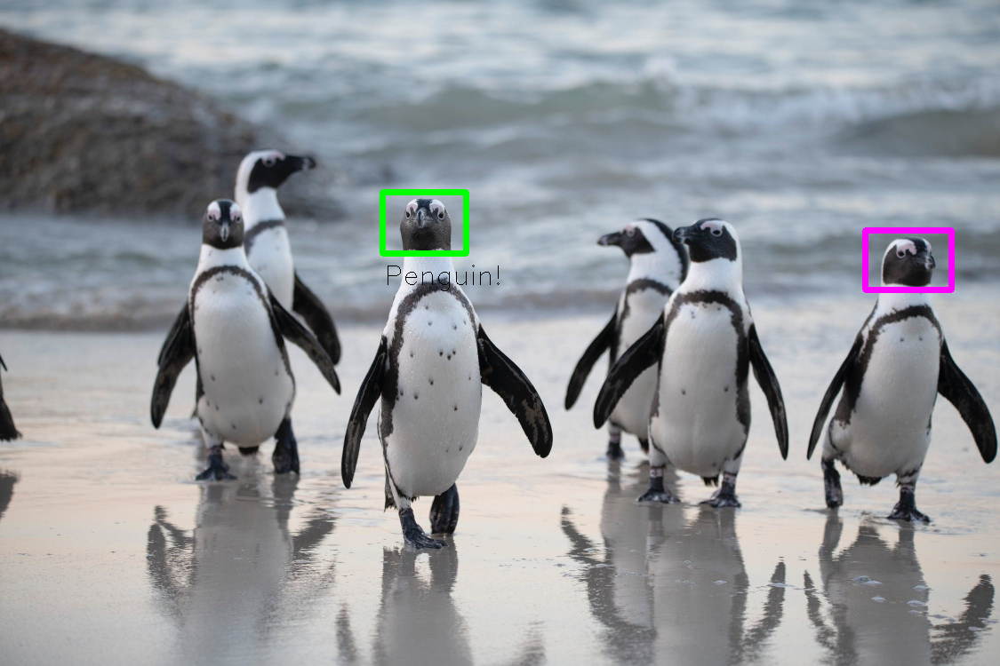

-1

In [11]:
cv2_imshow(img)
cv2.waitKey(0)

In [12]:

cv2.imwrite( 'final.jpg', img)

True

**RESIZE IMAGE**

(200, 400, 3)


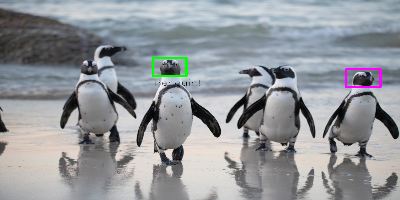

In [13]:
width = 400
height = 200

small_img = cv2.resize(img, (width, height), interpolation = cv2.INTER_LINEAR_EXACT)
print(small_img.shape)
cv2_imshow(small_img)

**CROP IMAGE**

(100, 100, 3)


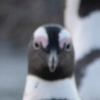

In [14]:
cropped_img = img[200:300, 200:300]
print(cropped_img.shape)
cv2_imshow(cropped_img)

In [15]:
copy_img = small_img.copy()
img_height, img_width = copy_img.shape[0], copy_img.shape[1]

print(img_height, img_width)

200 400


In [16]:
H, W = img_height //4, img_width//4
x1, y1 = 0, 0
path = './cropped/'
for y in range(0, img_height, H):
  for x in range(0, img_width, W):
    if (img_height - y) < H or (img_width-x) < W :
      break
    
    y1 = y + H
    x1 = x + W
    # check if the patch width or height exceeds the image width or height
    if x1 >= img_width:
      x1-=1 
    if y1 >= img_height:
      y1-=1
    
    crop_img = copy_img[y:y+H, x:x+W]
    file_name = 'tile' + str(x)+'_'+str(y) + '.jpg'
    cv2.imwrite(os.path.join(path, file_name), crop_img)
    cv2.rectangle(small_img, (x, y), (x1, y1), (0, 255, 0), 2)

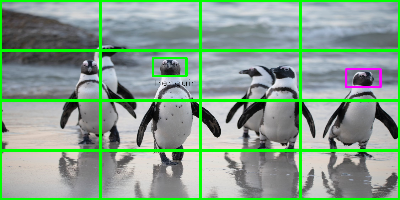

True

In [17]:
cv2_imshow(small_img)
cv2.imwrite('spit_image.jpg', small_img)

**Rotation and Translation Image**

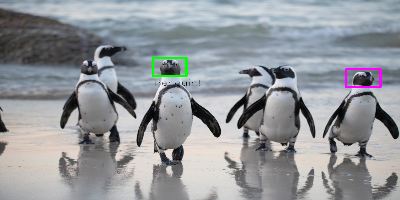

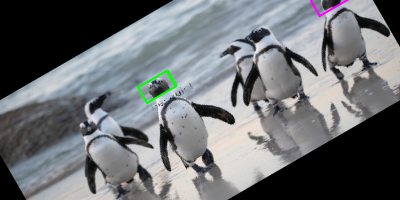

True

In [18]:
image = cv2.resize(img, (400, 200), interpolation = cv2.INTER_LINEAR_EXACT)
height, width = image.shape[:2]
center = (width/2, height/2)

rotate_matrix = cv2.getRotationMatrix2D(center = center, angle=30, scale=1)
rotated_img = cv2.warpAffine(image, M = rotate_matrix, dsize=(width,height))

cv2_imshow(image)
cv2_imshow(rotated_img)
cv2.imwrite("Rotated_image.jpg", rotated_img)

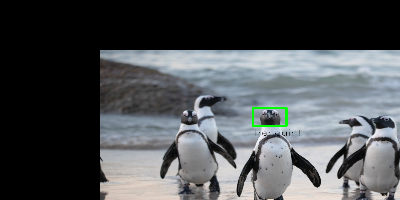

In [19]:
tx, ty = width /4, height/4
translation_matrix = np.array([
                               [1,0,tx],
                               [0,1,ty]
], dtype = np.float32)

translated_img = cv2.warpAffine(image, M = translation_matrix, dsize=(width,height))

cv2_imshow(translated_img)

**Edge Detection**

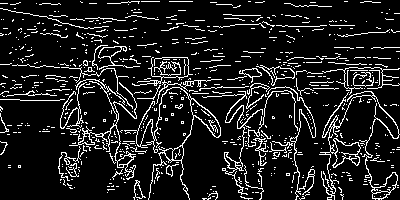

In [20]:
# Canny Edge Detection
edge_canny = cv2.Canny(image, 100,100)

cv2_imshow(edge_canny)

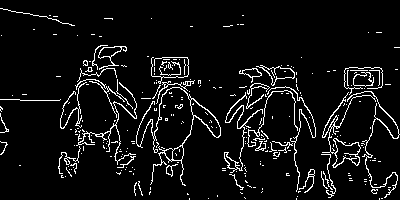

In [21]:
edge_canny = cv2.Canny(image, 200,200)

cv2_imshow(edge_canny)

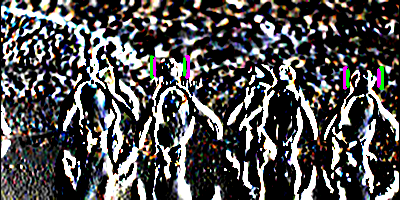

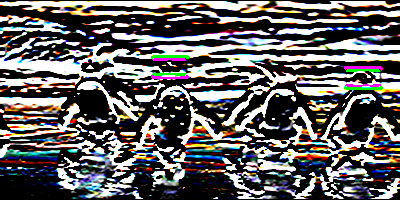

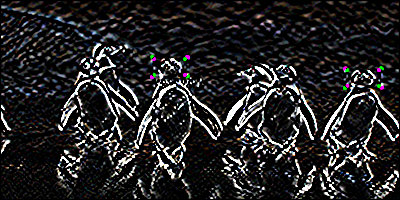

In [22]:
# Sobel Edge Detection
edge_sobel_x = cv2.Sobel(image, ddepth=cv2.CV_64F, dx=1,dy=0, ksize=5) # x_direction
cv2_imshow(edge_sobel_x)

edge_sobel_y = cv2.Sobel(image, ddepth=cv2.CV_64F, dx=0,dy=1, ksize=5) # y_direction
cv2_imshow(edge_sobel_y)

edge_sobel = cv2.Sobel(image, ddepth=-1, dx=1,dy=1, ksize=5)
cv2_imshow(edge_sobel)

**Change Color Image**

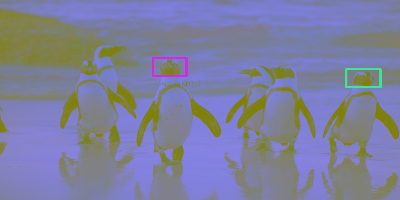

In [23]:
img_LAB = cv2.cvtColor(image, cv2.COLOR_BGR2Lab)

cv2_imshow(img_LAB)

**Image Filtering Using Convolution**

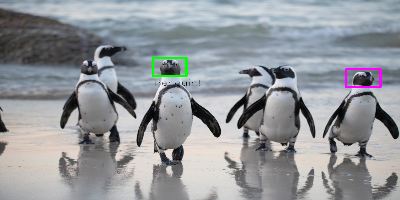

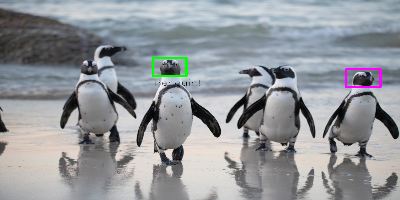

In [24]:
# Identity kernel
kernel_1 = np.array([
                     [0,0,0],
                     [0,1,0],
                     [0,0,0] ])
identity = cv2.filter2D(image, ddepth=-1, kernel=kernel_1)
cv2_imshow(image)
cv2_imshow(identity)

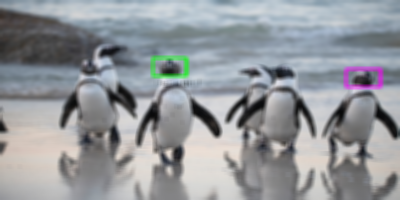

In [25]:
kernel_2 = np.ones((5,5), np.float32) / 25
blur_img_1 = cv2.filter2D(image, ddepth=0, kernel=kernel_2)
cv2_imshow(blur_img_1)

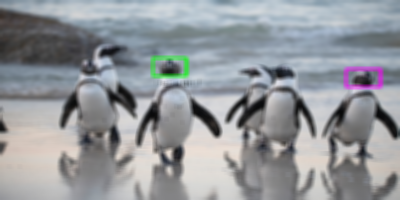

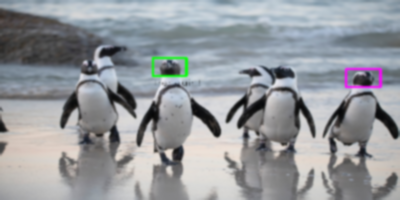

In [26]:
blur_img_2 = cv2.blur(src=image, ksize=(5,5))
cv2_imshow(blur_img_2)

# Gaussian blur
gaussian_blur = cv2.GaussianBlur(src=image, ksize=(5,5), sigmaX=1, sigmaY=1)
cv2_imshow(gaussian_blur)

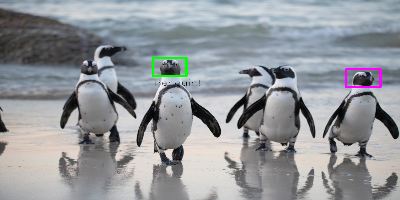

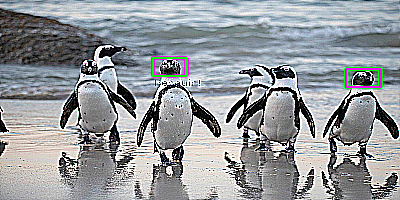

In [27]:
# Sharpened Image

kernel_3 = np.array([ [-1,-1,-1],
                      [-1,9,-1],
                      [-1,-1,-1]])

sharpened_img = cv2.filter2D(src=image, ddepth=-1, kernel=kernel_3)

cv2_imshow(image)
cv2_imshow(sharpened_img)

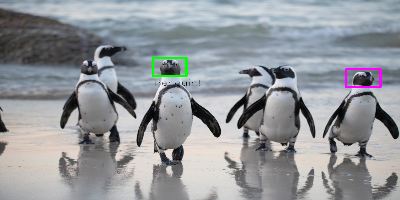

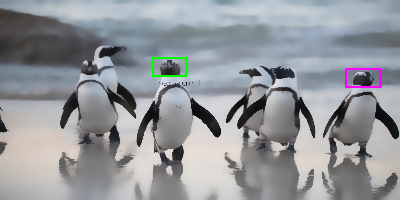

In [28]:
# Bilateral Filtering
bilateral_filter = cv2.bilateralFilter(src=image, d=10, sigmaColor=100, sigmaSpace=10)

cv2_imshow(image)
cv2_imshow(bilateral_filter)

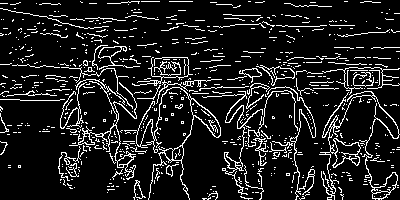

--------------------------


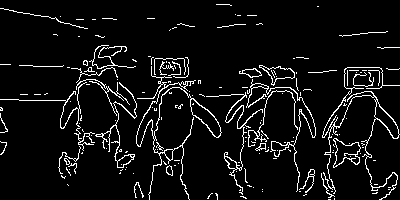

In [29]:
test_1 = cv2.Canny(image, 100,100)
test_2 = cv2.Canny(bilateral_filter, 100,100)

cv2_imshow(test_1)
print("--------------------------")
cv2_imshow(test_2)

**Thresholding**

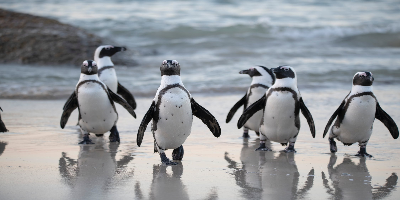

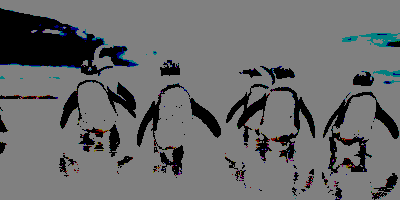

In [37]:
img = cv2.imread('/content/sea.jpeg', 1)
image = cv2.resize(img,(400,200))

th, dst = cv2.threshold(image, 100, 128, cv2.THRESH_BINARY)

cv2_imshow(image)
cv2_imshow(dst)


**Contour Detection**

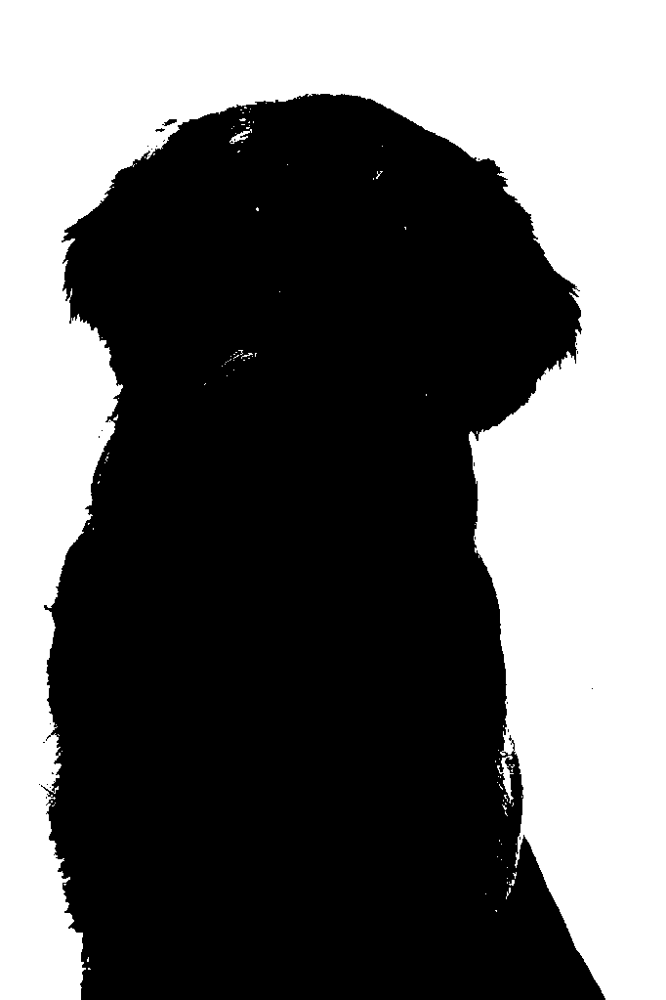

In [81]:
img = cv2.imread('/content/dog.png')
image = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

_, thresh = cv2.threshold(image, 235, 255, cv2.THRESH_BINARY)
cv2_imshow(thresh)

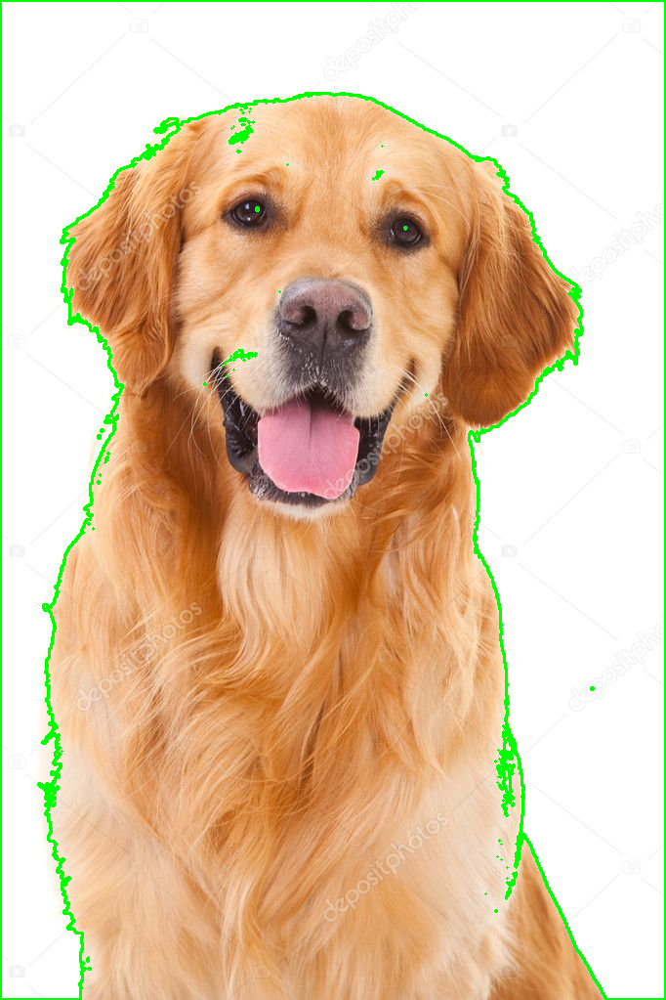

In [83]:
# Use findContours function to detect contours
contours, hierachy = cv2.findContours(image=thresh, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_SIMPLE)

# draw contours on the original image by drawContour function
image_copy = img.copy()
cv2.drawContours(image=image_copy, contours=contours, contourIdx=-1, color=(0,255,0), thickness=2)
cv2_imshow(image_copy)

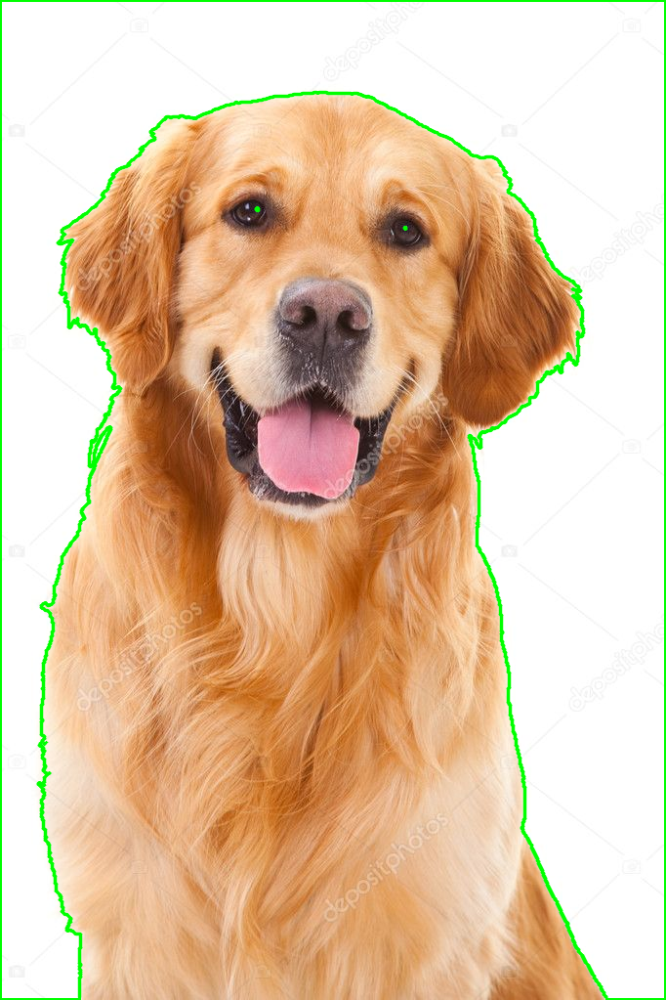

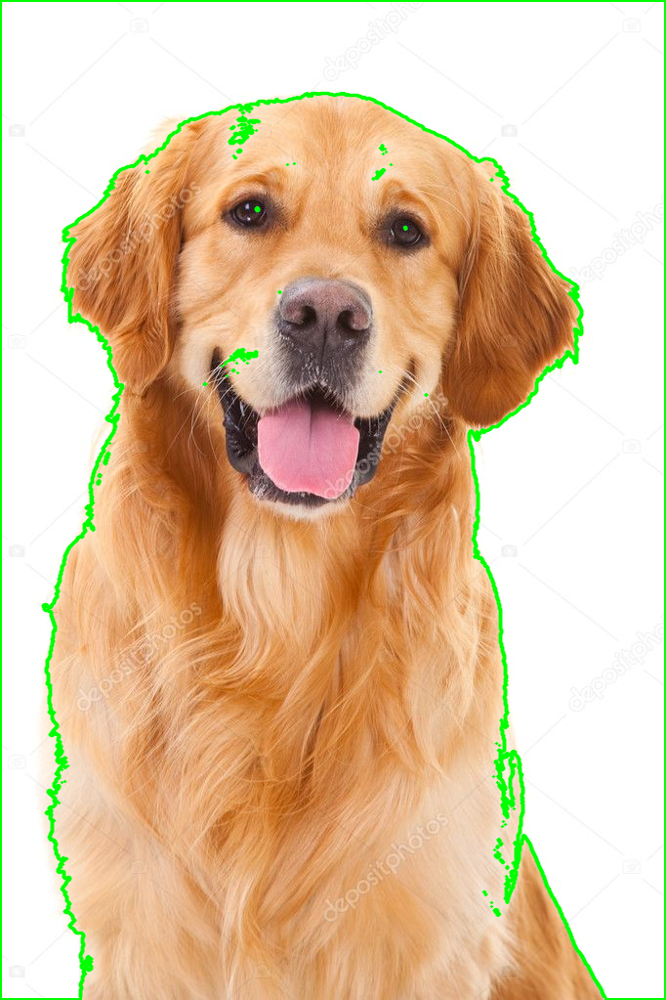

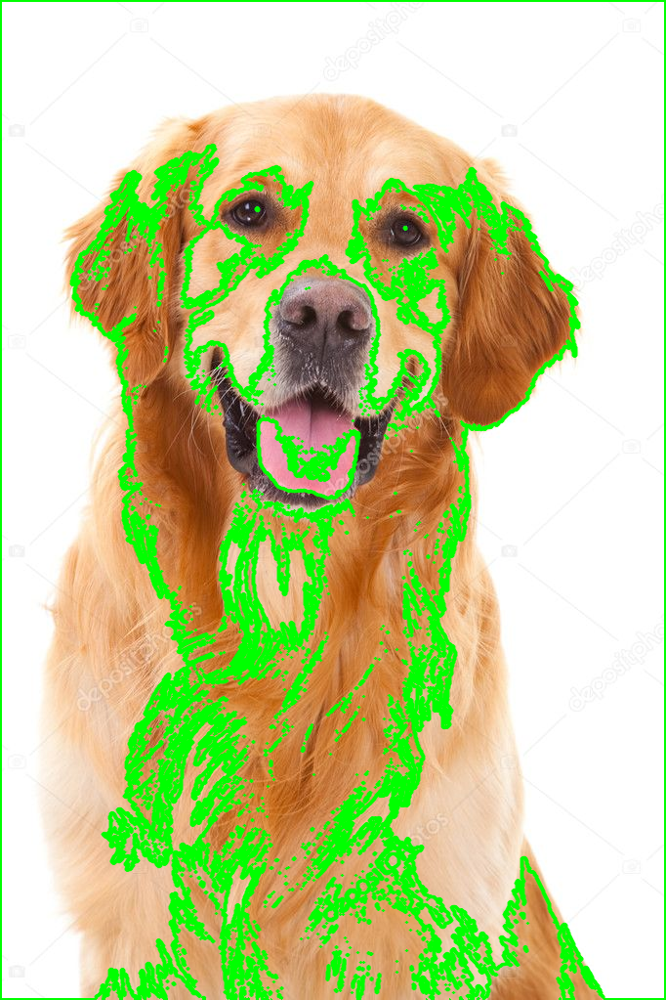

In [109]:
blue, green, red = cv2.split(img)

# Contour with blue chanel
_, thresh1 = cv2.threshold(blue, 230, 255, cv2.THRESH_BINARY)
contours1, hierarchy1 = cv2.findContours(image=thresh1, mode=cv2.RETR_EXTERNAL, method=cv2.CHAIN_APPROX_SIMPLE)
image_contour_blue = img.copy()
cv2.drawContours(image=image_contour_blue, contours=contours1, contourIdx=-1, color=(0, 255, 0), thickness=2, lineType=cv2.LINE_AA)

cv2_imshow(image_contour_blue)

# Contour with green chanel
_, thresh2 = cv2.threshold(green, 230, 255, cv2.THRESH_BINARY)
contours2, hierarchy2 = cv2.findContours(image=thresh2, mode=cv2.RETR_EXTERNAL, method=cv2.CHAIN_APPROX_NONE)
image_contour_green = img.copy()
cv2.drawContours(image=image_contour_green, contours=contours2, contourIdx=-1, color=(0, 255, 0), thickness=2, lineType=cv2.LINE_AA)

cv2_imshow(image_contour_green)

# Contour with red chanel
_, thresh3 = cv2.threshold(red, 230, 255, cv2.THRESH_BINARY)
contours3, hierarchy3 = cv2.findContours(image=thresh3, mode=cv2.RETR_EXTERNAL, method=cv2.CHAIN_APPROX_NONE)
image_contour_red = img.copy()
cv2.drawContours(image=image_contour_red, contours=contours3, contourIdx=-1, color=(0, 255, 0), thickness=2, lineType=cv2.LINE_AA)

cv2_imshow(image_contour_red)

**Read and Write Video**

In [31]:
vid_capture = cv2.VideoCapture('/content/street.gif')

if (vid_capture.isOpened() == False):
  print("Error opening the video")
else:
  # Get frame rate information
  fps = vid_capture.get(5)
  print('Frames per second : ', fps,'FPS')

  # Get frame count
  frame_count = vid_capture.get(7)
  print('Frame count : ', frame_count)

Error opening the video


In [32]:
while(vid_capture.isOpened()):
  ret, frame = vid_capture.read()

  if ret == True:
    cv2_imshow(frame)
  else:
    break

vid_capture.release()